In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import HeatMap

sns.set_style("darkgrid")

# Import data

In [3]:
env_vectors = pd.read_csv('input/environmental_vectors.csv', delimiter=';', index_col=0)
train = pd.read_csv('input/observations/observations_fr_train.csv', delimiter=';', index_col=0)
species_details = pd.read_csv('input/metadata/species_details.csv', delimiter=';')

train_env = env_vectors.join(train, how='right').reset_index().merge(species_details, left_on='species_id', right_on='species_id').set_index('observation_id')
print(f'Shape of dataset: {train_env.shape}')

Shape of dataset: (671244, 36)


In [4]:
train_env.head()

,bio_1,bio_2,bio_3,bio_4,bio_5,bio_6,bio_7,bio_8,bio_9,bio_10,...,sndppt,latitude,longitude,species_id,subset,GBIF_species_id,GBIF_species_name,GBIF_genus_name,GBIF_family_name,GBIF_kingdom_name
observation_id,,,,,,,,,,,,,,,,,,,,,
10561949,11.229167,8.724999,37.286324,556.81506,24.5,1.1,23.400000,8.033333,18.266666,18.266666,...,44.0,45.705116,1.424622,241,train,3093911,Hypochaeris glabra,Hypochaeris,Asteraceae,Plantae
10720255,9.737500,8.591667,36.099440,574.42114,23.2,-0.6,23.800001,3.816667,9.050000,16.966667,...,31.0,49.737705,4.719368,241,train,3093911,Hypochaeris glabra,Hypochaeris,Asteraceae,Plantae
10107983,10.904166,7.941667,34.231323,569.82635,24.2,1.0,23.200000,16.316666,6.950000,18.100000,...,41.0,48.665524,2.259638,241,train,3093911,Hypochaeris glabra,Hypochaeris,Asteraceae,Plantae
10749643,12.850000,10.066667,40.106240,562.21960,26.9,1.8,25.100000,9.616667,19.883333,19.883333,...,33.0,44.383678,0.796687,241,train,3093911,Hypochaeris glabra,Hypochaeris,Asteraceae,Plantae
10560088,9.537500,7.575000,35.900470,505.29077,21.7,0.6,21.100000,4.500000,15.883333,15.883333,...,34.0,48.696301,0.463307,241,train,3093911,Hypochaeris glabra,Hypochaeris,Asteraceae,Plantae


# Overview 

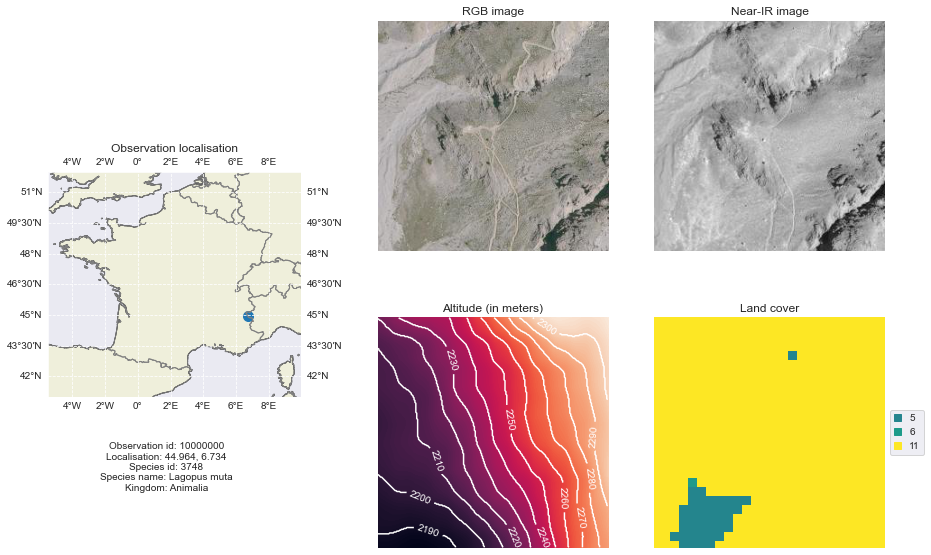

In [5]:
from GLC.plotting import visualize_observation_patch
from GLC.data_loading.common import load_patch

patch = load_patch(10000000, 'input')

#landcover_labels = df_suggested_landcover_alignment[["suggested_landcover_code", "suggested_landcover_label"]].drop_duplicates().sort_values("suggested_landcover_code")["suggested_landcover_label"].values

visualize_observation_patch(patch, observation_data=train_env.loc[10000000])

# Target distribution

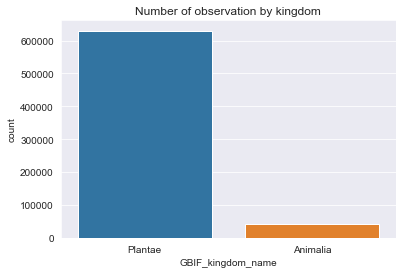

In [5]:
sns.countplot(data=train_env, x='GBIF_kingdom_name').set_title('Number of observation by kingdom');

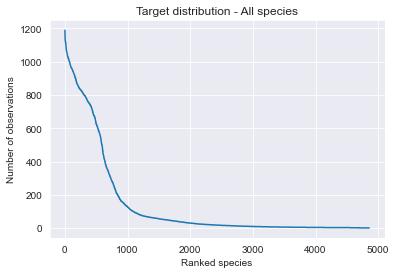

In [6]:
count_by_species = train_env['species_id'].value_counts()
ranked_species = count_by_species.reset_index().reindex(range(1,len(count_by_species))).rename(columns={'index' : 'specie_id', 'species_id' : 'count'})

sns.lineplot(x=ranked_species.index, y=ranked_species['count'])
plt.title('Target distribution - All species')
plt.xlabel('Ranked species')
plt.ylabel('Number of observations');

# Top 500

In [7]:
top500 = train_env['species_id'].value_counts()[:500].index.values
train_env['top500'] = train_env['species_id'].apply(lambda x : True if x in top500 else False)
train_env_top500 = train_env[train_env['top500'] == True].drop(columns=['top500']).copy()
print(f'Shape of top500 train data: {train_env_top500.shape}')

Shape of top500 train data: (425912, 36)


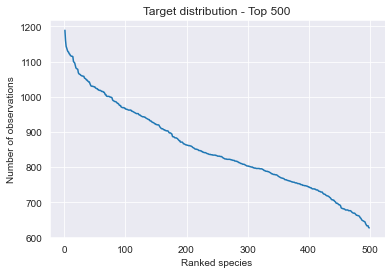

In [8]:
count_by_species = train_env_top500['species_id'].value_counts()
ranked_species = count_by_species.reset_index().reindex(range(1,len(count_by_species))).rename(columns={'index' : 'specie_id', 'species_id' : 'count'})

sns.lineplot(x=ranked_species.index, y=ranked_species['count'])
plt.title('Target distribution - Top 500')
plt.xlabel('Ranked species')
plt.ylabel('Number of observations');

In [9]:
# Initialization of the map
m = folium.Map(location=[train_env_top500['latitude'].mean(), train_env_top500['longitude'].mean()],zoom_start = 7, tiles='cartodb positron') 

coords = list(zip(train_env_top500['latitude'], train_env_top500['longitude']))

HeatMap(coords, min_opacity=0.3).add_to(m)
m

# Correlation

<AxesSubplot:>

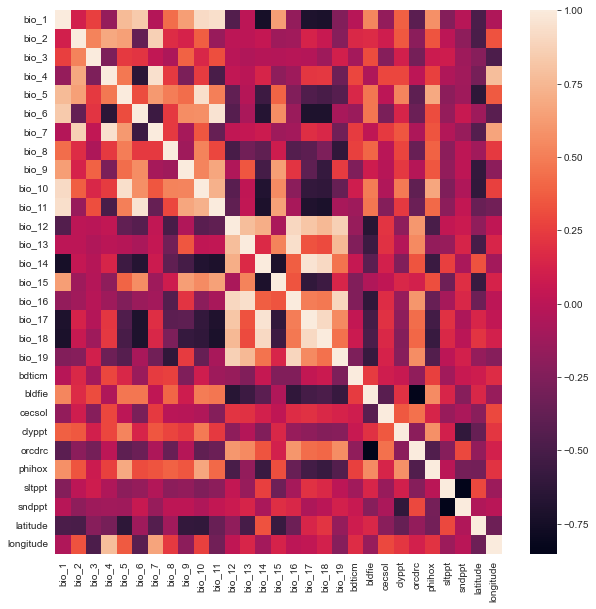

In [22]:
plt.figure(figsize=(10,10))
sns.heatmap(train_env_top500.iloc[:,:-7].corr())